In [17]:
import os
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

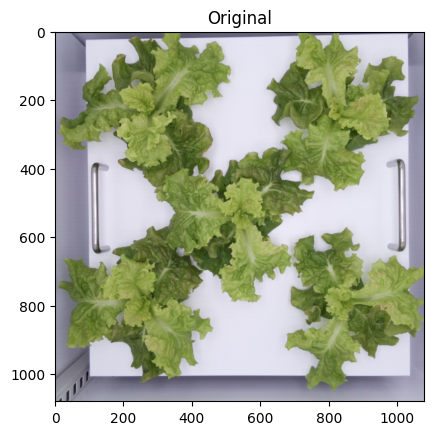

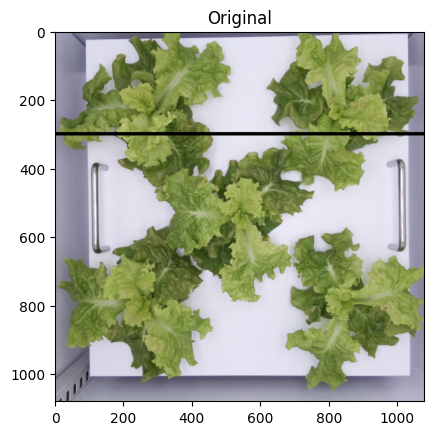

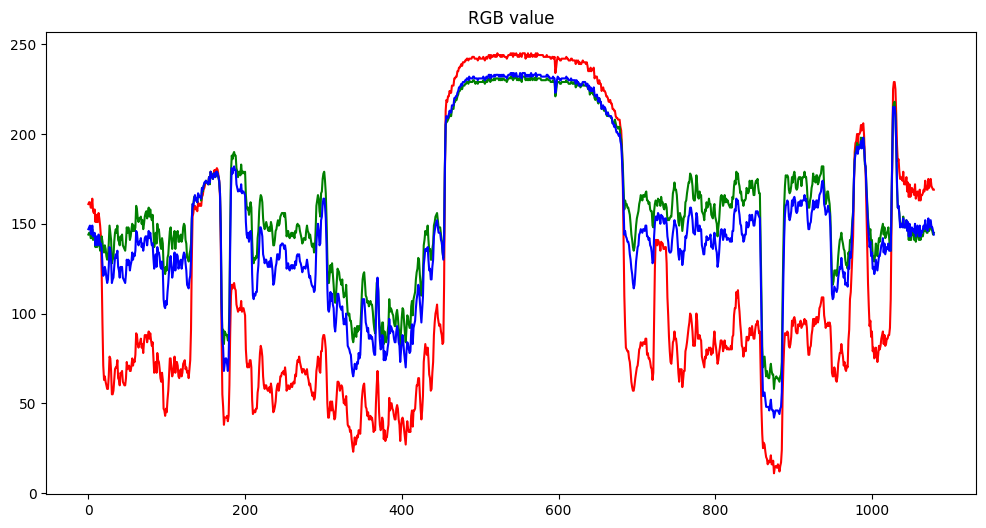

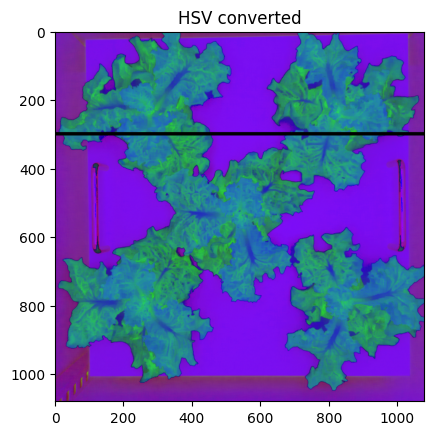

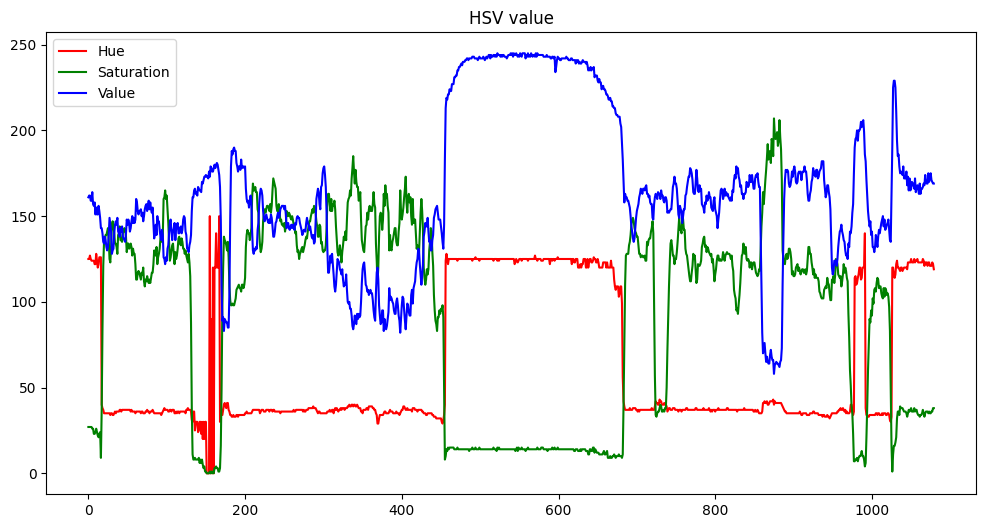

...

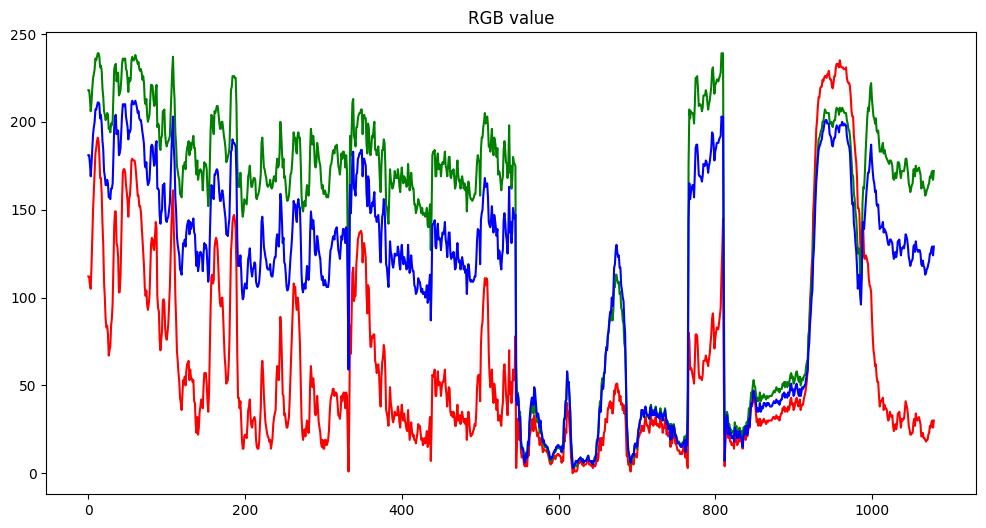

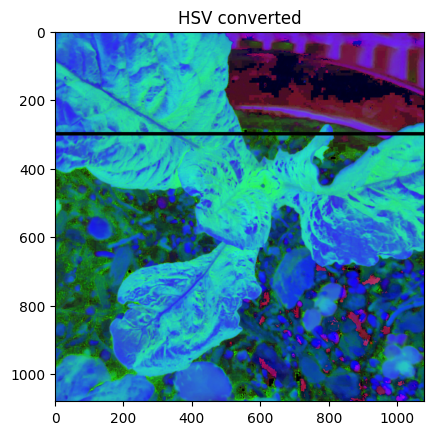

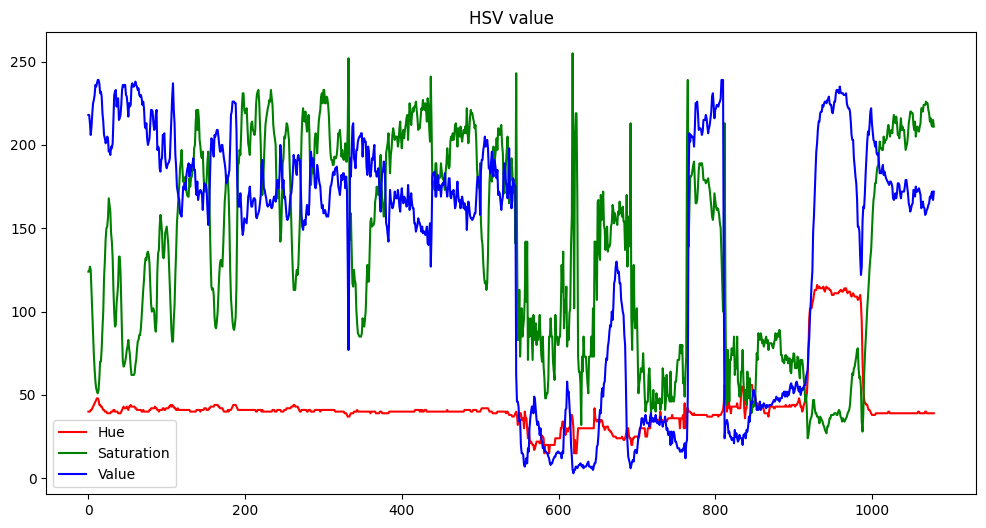

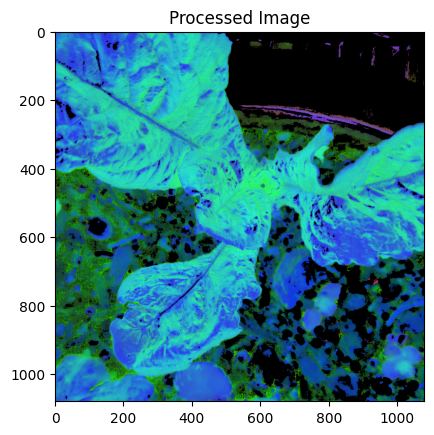

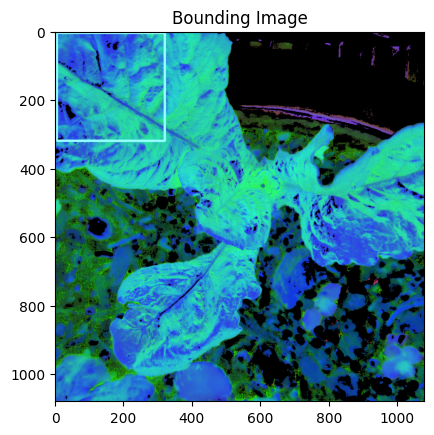

In [18]:
def crop_image(img, left, right, top, bottom):
    return img[top:-bottom, left:-right]

def get_crop_coordinates(width, height):
    if width == 3280 and height == 2464:
        return 440, 440, 32, 32
    elif width == 3000 and height == 4000:
        return 300, 300, 800, 800
    elif width == 4000 and height == 3000:
        return 800, 800, 300, 300
    else:
        raise ValueError(f"Unsupported image size: {width} x {height}.")

def process_and_show_image(image_path):
    img = cv2.imread(image_path)
    width, height = img.shape[1], img.shape[0]

    left_margin, right_margin, top_margin, bottom_margin = get_crop_coordinates(width, height)

    cropped_image = crop_image(img, left_margin, right_margin, top_margin, bottom_margin)

    desired_width = 600
    desired_height = 600
    cropped_image = cv2.resize(cropped_image, (desired_width, desired_height))

    plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.show()

    line_img = np.asarray(cropped_image).copy()
    line_img[295:305,:,:] = [0,0,0]
    plt.imshow(cv2.cvtColor(line_img, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.show()

    img_r = np.asarray(cropped_image)[300,:,0]
    img_g = np.asarray(cropped_image)[300,:,1]
    img_b = np.asarray(cropped_image)[300,:,2]
    plt.figure(figsize=(12, 6))
    plt.plot(img_r, color='red')
    plt.plot(img_g, color='green')
    plt.plot(img_b, color='blue')
    plt.title('RGB value')
    plt.show()

    cropped_image_hsv = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2HSV)
    line_img = np.asarray(cropped_image_hsv).copy()
    line_img[295:305,:,:] = [0,0,0]
    plt.imshow(line_img)
    plt.title('HSV converted')
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(cropped_image_hsv[300, :, 0], color='red', label='Hue')
    plt.plot(cropped_image_hsv[300, :, 1], color='green', label='Saturation')
    plt.plot(cropped_image_hsv[300, :, 2], color='blue', label='Value')
    plt.title('HSV value')
    plt.legend()
    plt.show()

    cropped_image_hsv = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2HSV)
    threshold_value = 50
    _, saturation_mask = cv2.threshold(cropped_image_hsv[:, :, 1], threshold_value, 255, cv2.THRESH_BINARY)
    mask = np.zeros_like(cropped_image)
    mask[saturation_mask > 0] = [255, 255, 255]
    result_image = cv2.bitwise_and(cropped_image, mask)

    plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2HSV))
    plt.title('Processed Image')
    plt.show()

    cropped_image_hsv = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2HSV)
    threshold_value = 50
    _, saturation_mask = cv2.threshold(cropped_image_hsv[:, :, 1], threshold_value, 255, cv2.THRESH_BINARY)
    mask = np.zeros_like(cropped_image)
    mask[saturation_mask > 0] = [255, 255, 255]
    result_image = cv2.bitwise_and(cropped_image, mask)

    square_img = np.asarray(result_image).copy()
    top_left = (5, 5)
    bottom_right = (320, 320)
    cv2.rectangle(square_img, top_left, bottom_right, (255, 0, 255), thickness=5)

    plt.imshow(cv2.cvtColor(square_img, cv2.COLOR_BGR2HSV))
    plt.title('Bounding Image')
    plt.show()


img_path1 = r"../dataset/practice/before/Test1.png"
img_path2 = r"../dataset/practice/before/Test2.png"
img_path3 = r"../dataset/practice/before/Test3.jpg"
img_path4 = r"../dataset/practice/before/Test4.jpg"
img_path5 = r"../dataset/practice/before/Test5.jpg"

process_and_show_image(img_path1)
process_and_show_image(img_path2)
process_and_show_image(img_path3)
process_and_show_image(img_path4)
process_and_show_image(img_path5)